# Key Diagnostics: CESM3 / MOM6 experiment comparison

This notebook presents the key ocean diagnostics for a set of coupled and forced
experiments. The shared `Experiment` class lives in `experiment.py` so it can be
reused across notebooks.

**Experiments compared**

| name | mode | data folder |
|------|------|-------------|
| `CTRL` | coupled | `data/coupled_55years` |
| `coupled_bANN_1.0` | coupled | `data/coupled_55years` |
| `coupled_bANN_1.0_uANN_1.0` | coupled | `data/coupled_55years` |
| `forced_CTRL` | forced | `data/forced_55years` |
| `forced_bANN_1.0` | forced | `data/forced_55years` |
| `forced_bANN_1.0_uANN_1.0` | forced | `data/forced_55years` |

**Kernel:** `env-from-npl-2024a` (Python 3.11.6).


In [2]:
%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings('ignore')

import os

import numpy as np
import matplotlib.pyplot as plt
import cftime

from experiment import Experiment

plt.rcParams['figure.figsize'] = (15, 5)
plt.rcParams.update({'font.size': 18})

# Repo-root-relative paths (this notebook lives in <repo>/notebooks)
REPO = os.path.abspath(os.path.join(os.getcwd(), '..'))
YAML_DIR = os.path.join(REPO, 'yamls')
COUPLED_DIR = os.path.join(REPO, 'data', 'coupled_55years')
FORCED_DIR = os.path.join(REPO, 'data', 'forced_55years')
FIG_DIR = os.path.join(REPO, 'figures', 'coupled_55years')

print('REPO       =', REPO)
print('YAML_DIR   =', YAML_DIR)
print('COUPLED_DIR=', COUPLED_DIR)
print('FORCED_DIR =', FORCED_DIR)


REPO       = /glade/u/home/pavelp/m2lines-CESM3-diagnostics
YAML_DIR   = /glade/u/home/pavelp/m2lines-CESM3-diagnostics/yamls
COUPLED_DIR= /glade/u/home/pavelp/m2lines-CESM3-diagnostics/data/coupled_55years
FORCED_DIR = /glade/u/home/pavelp/m2lines-CESM3-diagnostics/data/forced_55years


## Initialize experiments (read-only)

Each experiment is defined by its `name`, the diagnostics YAML config, and the
folder holding its postprocessed NetCDF files. Initialization is read-only: it
only reads config + (best-effort) grid, and never triggers heavy computation.


In [3]:
# (name, folder) for each experiment. YAML config is yamls/<name>.yaml
experiment_defs = [
    ('CTRL',                        COUPLED_DIR),
    ('coupled_bANN_1.0',            COUPLED_DIR),
    ('coupled_bANN_1.0_uANN_1.0',   COUPLED_DIR),
    ('forced_CTRL',                 FORCED_DIR),
    ('forced_bANN_1.0',             FORCED_DIR),
    ('forced_bANN_1.0_uANN_1.0',    FORCED_DIR),
]

exps = {}
for name, folder in experiment_defs:
    yaml_path = os.path.join(YAML_DIR, f'{name}.yaml')
    exps[name] = Experiment(yaml_path, folder=folder, name=name,
                            load_grid=True, verbose=True)

exp_names = list(exps.keys())
coupled_names = ['coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0', 'CTRL' ]
forced_names = ['forced_bANN_1.0', 'forced_bANN_1.0_uANN_1.0', 'forced_CTRL']

print('\nInitialized:', exp_names)


[CTRL] casename=CTRL, rundir=/glade/derecho/scratch/jiarongw/CTRL/run


ERROR 1: PROJ: proj_create_from_database: Open of /glade/work/pavelp/conda-envs/env-from-npl-2024a/share/proj failed


MOM6 grid successfully loaded... 

[coupled_bANN_1.0] casename=coupled_bANN_1.0, rundir=/glade/derecho/scratch/pavelp/coupled_bANN_1.0/run
MOM6 grid successfully loaded... 

[coupled_bANN_1.0_uANN_1.0] casename=coupled_bANN_1.0_uANN_1.0, rundir=/glade/derecho/scratch/pavelp/coupled_bANN_1.0_uANN_1.0/run
MOM6 grid successfully loaded... 

[forced_CTRL] casename=forced_CTRL, rundir=/glade/derecho/scratch/pavelp/forced_CTRL/run
MOM6 grid successfully loaded... 

[forced_bANN_1.0] casename=forced_bANN_1.0, rundir=/glade/derecho/scratch/pavelp/forced_bANN_1.0/run
MOM6 grid successfully loaded... 

[forced_bANN_1.0_uANN_1.0] casename=forced_bANN_1.0_uANN_1.0, rundir=/glade/derecho/scratch/pavelp/forced_bANN_1.0_uANN_1.0/run
MOM6 grid successfully loaded... 


Initialized: ['CTRL', 'coupled_bANN_1.0', 'coupled_bANN_1.0_uANN_1.0', 'forced_CTRL', 'forced_bANN_1.0', 'forced_bANN_1.0_uANN_1.0']


In [4]:
# Short legend labels (regime is shown in the panel title, so it is omitted here)
LABELS = {
    'CTRL':                       'GM',
    'coupled_bANN_1.0':           'bANN',
    'coupled_bANN_1.0_uANN_1.0':  'bANN_uANN',
    'forced_CTRL':                'GM',
    'forced_bANN_1.0':            'bANN',
    'forced_bANN_1.0_uANN_1.0':   'bANN_uANN',
}


# 1. Global Mean Ocean Potential Temperature

Monthly global-mean ocean potential temperature (`thetaoga`) versus time,
read from each experiment's `*_mon_ave_global_means.nc` file. `CTRL` /
`forced_CTRL` are drawn in black as the reference.


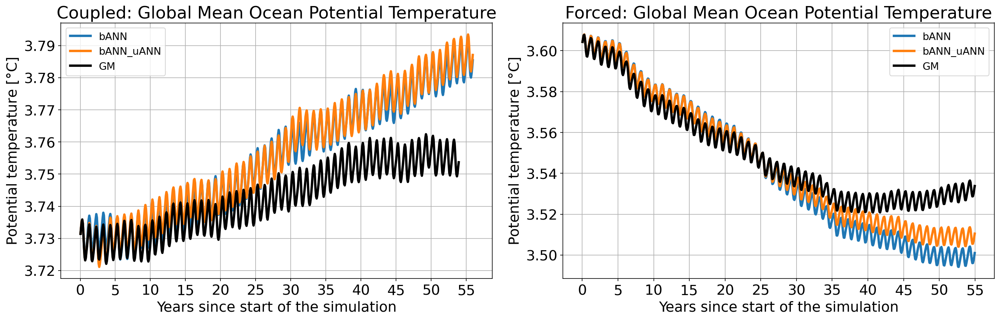

In [35]:
# Load global-mean timeseries for every experiment
global_means = {name: exp.global_means().load() for name, exp in exps.items()}


def plot_global_mean(ax, names, var, title, ylabel):
    """Plot a global-mean scalar timeseries (e.g. thetaoga, soga) vs time."""
    for name in names:
        da = global_means[name][var]
        is_ctrl = name.endswith('CTRL')
        da.plot(ax=ax, label=LABELS[name], lw=3, color='k' if is_ctrl else None)

    # x-axis: years since start of simulation (5-year ticks)
    time = global_means[names[0]][var].time.values
    years = range(time[0].year, time[-1].year + 2, 5)
    ticks = [cftime.DatetimeNoLeap(y, 1, 1) for y in years]
    ax.set_xticks(ticks)
    ax.set_xticklabels(np.arange(0, len(ticks) * 5, 5))
    ax.set_xlabel('Years since start of the simulation')
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.grid(True)
    ax.legend(loc='best', fontsize=13)


fig, axes = plt.subplots(1, 2, figsize=(18, 6), dpi=150)
plot_global_mean(axes[0], coupled_names, 'thetaoga',
                 'Coupled: Global Mean Ocean Potential Temperature',
                 r'Potential temperature [$\degree$C]')
plot_global_mean(axes[1], forced_names, 'thetaoga',
                 'Forced: Global Mean Ocean Potential Temperature',
                 r'Potential temperature [$\degree$C]')
plt.tight_layout()
plt.show()


# 2. Global Mean Ocean Salinity

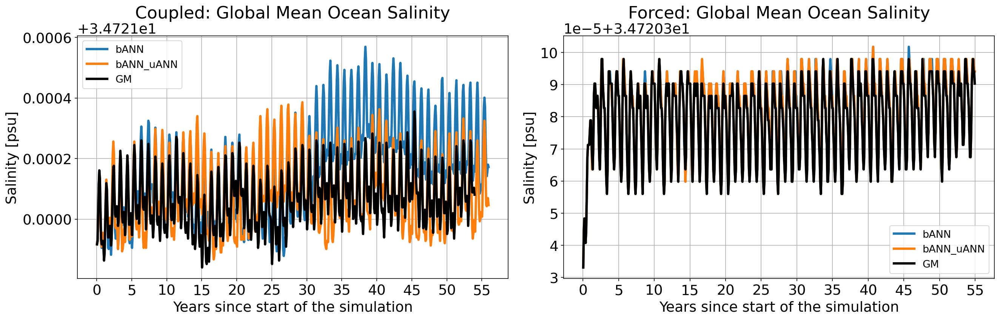

In [36]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6), dpi=150)
plot_global_mean(axes[0], coupled_names, 'soga',
                 'Coupled: Global Mean Ocean Salinity',
                 'Salinity [psu]')
plot_global_mean(axes[1], forced_names, 'soga',
                 'Forced: Global Mean Ocean Salinity',
                 'Salinity [psu]')
plt.tight_layout()
plt.show()


# 3. Ocean Heat Transport

Time-mean poleward ocean heat transport versus latitude, read from each
experiment's `*_heat_transport.nc` file (sum of advective + diffusive
components). The left column shows the **global** transport and the right
column the **Atlantic** basin only. `CTRL` / `forced_CTRL` are the black
reference curves.


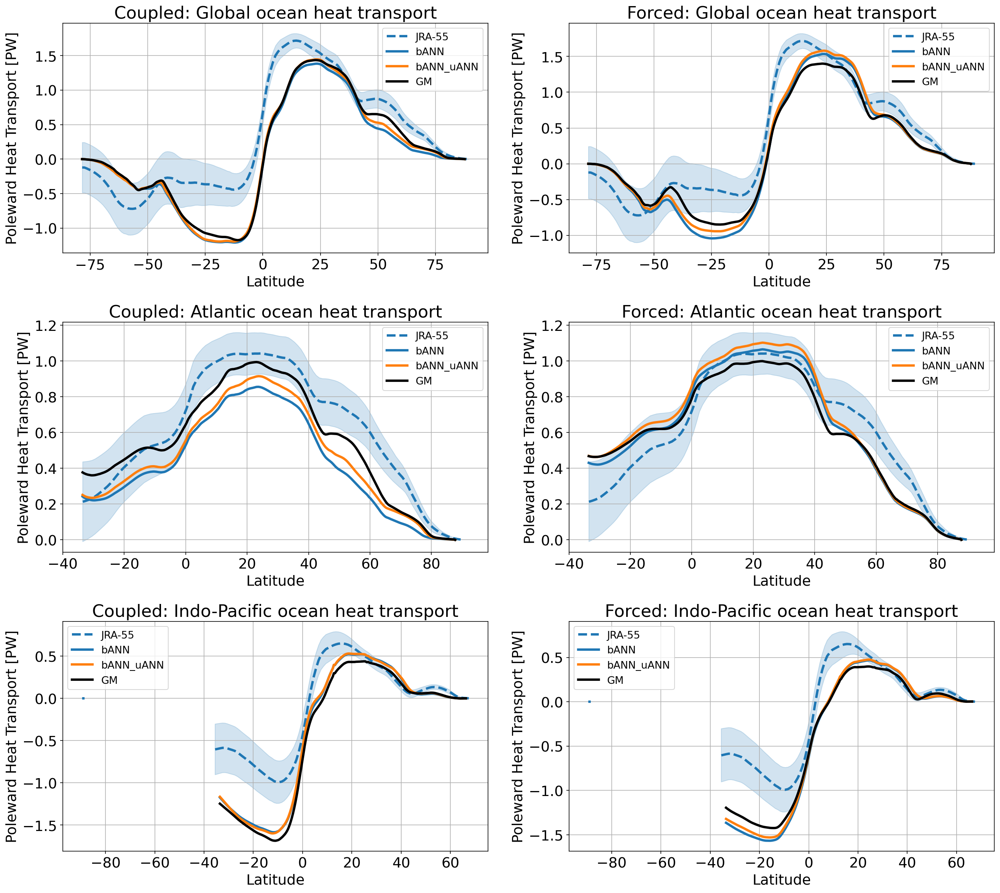

In [18]:
# Basin masks (all experiments share the same MOM6 grid).
# Region definitions follow mom6_tools/poleward_heat_transport.py:
#   Atlantic     = Atlantic + Arctic + Med + Black + Hudson Bay (codes 2,4,6,7,8)
#   Indo-Pacific = Pacific + Indian                             (codes 3,5)
basin_code_xr = exps['CTRL'].basin_code_xr
global_mask = basin_code_xr.sel(region='Global')

atl_mask = (basin_code_xr.sel(region='AtlanticOcean') + basin_code_xr.sel(region='Arctic') +
            basin_code_xr.sel(region='MedSea') + basin_code_xr.sel(region='BlackSea') +
            basin_code_xr.sel(region='HudsonBay'))
atl_mask['region'] = 'Atlantic mask'

indopac_mask = (basin_code_xr.sel(region='PacificOcean') + basin_code_xr.sel(region='IndianOcean'))
indopac_mask['region'] = 'Indo-Pacific mask'

PW = 1.0e15  # 1 petawatt in watts

# JRA-55(do) observational baseline (already in PW).
# basin index 0 = Global, 1 = Atlantic, 2 = Indo-Pacific.
import xarray as xr
jra = xr.open_dataset('/glade/work/gmarques/cesm/datasets/Heat_transport/'
                      'jra55fcst_v1_3_annual_1x1/nht_jra55do_v1_3.nc')
JRA_BASIN = {'global': 0, 'atlantic': 1, 'indo-pacific': 2}


def add_jra_baseline(ax, basin):
    """Overlay the JRA-55 mean (dashed black) with a +/-1 sigma band."""
    nht = jra.nht.isel(basin=JRA_BASIN[basin])
    jra_mean = nht.mean('time')
    jra_std = nht.std('time')
    ax.plot(jra_mean.lat, jra_mean, color='tab:blue', ls='--', lw=3, label='JRA-55')
    ax.fill_between(jra_mean.lat, jra_mean - jra_std, jra_mean + jra_std,
                    color='tab:blue', alpha=0.2)


def plot_heat_transport(ax, names, title, mask, xlim=None, jra_basin=None, min_lat=None):
    """Plot poleward ocean heat transport [PW] vs latitude.

    ``mask`` restricts the sum to a basin. Latitudes where the basin has no
    ocean cells are set to NaN (rather than summing to a misleading zero).
    ``min_lat`` blanks the curve south of that latitude (as in
    poleward_heat_transport.py: ``HTplot[yy<-34] = np.nan``) to hide the
    Southern-Ocean boundary discontinuity of the basin masks.
    """
    if jra_basin is not None:
        add_jra_baseline(ax, jra_basin)

    valid = mask.sum('xh').values > 0  # latitudes with at least one ocean cell
    for name in names:
        transport = exps[name].heat_transport() * mask.values
        total = transport.sum('xh') / PW
        total = total.where(xr.DataArray(valid, dims=total.dims))
        if min_lat is not None:
            total = total.where(total[total.dims[0]] >= min_lat)
        is_ctrl = name.endswith('CTRL')
        total.plot(ax=ax, label=LABELS[name], lw=3, color='k' if is_ctrl else None)
    ax.set_xlabel('Latitude')
    ax.set_ylabel('Poleward Heat Transport [PW]')
    ax.set_title(title)
    if xlim is not None:
        ax.set_xlim(xlim)
    ax.grid(True)
    ax.legend(loc='best', fontsize=13)


fig, axes = plt.subplots(3, 2, figsize=(18, 16), dpi=150)
plot_heat_transport(axes[0, 0], coupled_names, 'Coupled: Global ocean heat transport',
                    mask=global_mask, jra_basin='global')
plot_heat_transport(axes[0, 1], forced_names, 'Forced: Global ocean heat transport',
                    mask=global_mask, jra_basin='global')
plot_heat_transport(axes[1, 0], coupled_names, 'Coupled: Atlantic ocean heat transport',
                    mask=atl_mask, xlim=(-40, None), jra_basin='atlantic', min_lat=-34)
plot_heat_transport(axes[1, 1], forced_names, 'Forced: Atlantic ocean heat transport',
                    mask=atl_mask, xlim=(-40, None), jra_basin='atlantic', min_lat=-34)
plot_heat_transport(axes[2, 0], coupled_names, 'Coupled: Indo-Pacific ocean heat transport',
                    mask=indopac_mask, jra_basin='indo-pacific', min_lat=-34)
plot_heat_transport(axes[2, 1], forced_names, 'Forced: Indo-Pacific ocean heat transport',
                    mask=indopac_mask, jra_basin='indo-pacific', min_lat=-34)
plt.tight_layout()
plt.show()


# 4. North Atlantic heat transport by component

Decomposition of the Atlantic-basin poleward heat transport into the diagnosed
terms stored in `*_heat_transport.nc`. The physical meaning of each term was
verified directly in the MOM6 source
(`.../MOM6/src`, diagnostics registered in `tracer/MOM_tracer_registry.F90`).
These are the vertically-integrated meridional (`_2d`, "y") flux components of
potential temperature:

- **Advective** (`T_ady_2d`) — *"Advective (by residual mean) Meridional Flux
  of Potential Temperature"*. The flux is computed in
  `tracer/MOM_tracer_advect.F90` (`ad2d_y`) from the accumulated transport
  `vhtr`. In `core/MOM.F90` this transport is the **residual-mean** velocity:
  the Eulerian-mean transport is augmented by the GM bolus transport
  (`thickness_diffuse`) **and** the mixed-layer-eddy (MLE) bolus transport
  (`mixedlayer_restrat`) *before* `advect_tracer` is called. So `T_ady_2d`
  indeed contains **all** advective heat transport: Eulerian mean + GM
  streamfunction + mixed-layer-eddy streamfunction.

- **Diffusive** (`T_diffy_2d`) — *"Diffusive Meridional Flux of Potential
  Temperature"*. Filled inside the neutral-diffusion routine of
  `tracer/MOM_tracer_hor_diff.F90` (`df2d_y`), i.e. the **only** physical
  process is along-isopycnal (neutral / Redi) diffusion. Its diffusivity is the
  epineutral Laplacian tracer diffusivity `KHTR_h` (CMOR name **`diftrelo`**,
  registered in the same file), which in these runs is predicted by **MEKE**.

- **Lateral boundary diff., HBD** (`T_hbd_diffy_2d`) — *"Vertically-integrated
  meridional diffusive flux from the horizontal boundary diffusion scheme"*,
  from `tracer/MOM_hor_bnd_diffusion.F90`: a parameterization of **horizontal
  (non-neutral) mixing by mesoscale eddies inside the surface boundary layer**.
  Where isopycnals outcrop in the mixed layer they become near-vertical and
  neutral diffusion degenerates, so a *horizontal* (along-geopotential)
  Laplacian tracer diffusion is applied within the boundary layer (its depth
  from ePBL/KPP). That horizontal diffusion has both zonal and meridional
  components — the vertically-integrated **meridional** component is exactly
  `T_hbd_diffy_2d`, which is why a "boundary-layer" term projects onto latitude.

Same Atlantic basin mask as section 3 (codes 2, 4, 6, 7, 8), zonally integrated
and blanked south of 34$\degree$S. One panel per experiment (coupled top row,
forced bottom row).

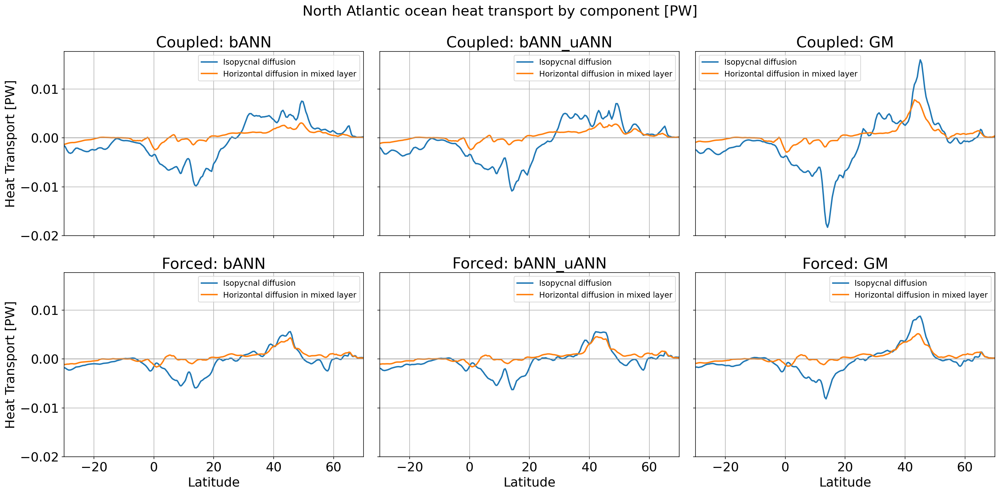

In [21]:
# Atlantic mask / valid latitudes (reuse the mask from section 3)
atl_valid = atl_mask.sum('xh').values > 0

HT_COMPONENTS = {
    #'Advective': 'T_ady_2d',
    'Isopycnal diffusion': 'T_diffy_2d',
    'Horizontal diffusion in mixed layer': 'T_hbd_diffy_2d',
}


def plot_ht_components(ax, name, mask, valid, min_lat=-34, xlim=(-30, 70)):
    """Atlantic heat-transport decomposition [PW] vs latitude for one experiment."""
    ds = exps[name].heat_transport_components()
    for label, var in HT_COMPONENTS.items():
        series = (ds[var].fillna(0.) * mask.values).sum('xh') / PW
        series = series.where(xr.DataArray(valid, dims=series.dims))
        series = series.where(series[series.dims[0]] >= min_lat)
        series.plot(ax=ax, label=label, lw=2)
    ax.axhline(0, color='0.6', lw=0.8)
    ax.set_xlim(xlim)
    ax.set_xlabel('Latitude')
    ax.set_ylabel('Heat Transport [PW]')
    ax.grid(True)
    ax.legend(fontsize=11)


fig, axes = plt.subplots(2, 3, figsize=(20, 10), dpi=150, sharex=True, sharey=True)
for row, (regime, names) in enumerate([('Coupled', coupled_names),
                                       ('Forced', forced_names)]):
    for col, name in enumerate(names):
        ax = axes[row, col]
        plot_ht_components(ax, name, atl_mask, atl_valid)
        ax.set_title(f'{regime}: {LABELS[name]}')
        if col:
            ax.set_ylabel('')
        if row == 0:
            ax.set_xlabel('')
fig.suptitle('North Atlantic ocean heat transport by component [PW]', fontsize=20)
plt.tight_layout()
plt.show()

# 5. Global heat transport by component

Same decomposition as section 4 (`T_ady_2d`, `T_diffy_2d`, `T_hbd_diffy_2d`
from `*_heat_transport.nc`) but zonally integrated over **all ocean basins**
instead of the Atlantic. The advective term dominates; the diffusive and HBD
terms are ~2 orders of magnitude smaller. One panel per experiment
(coupled top row, forced bottom row).

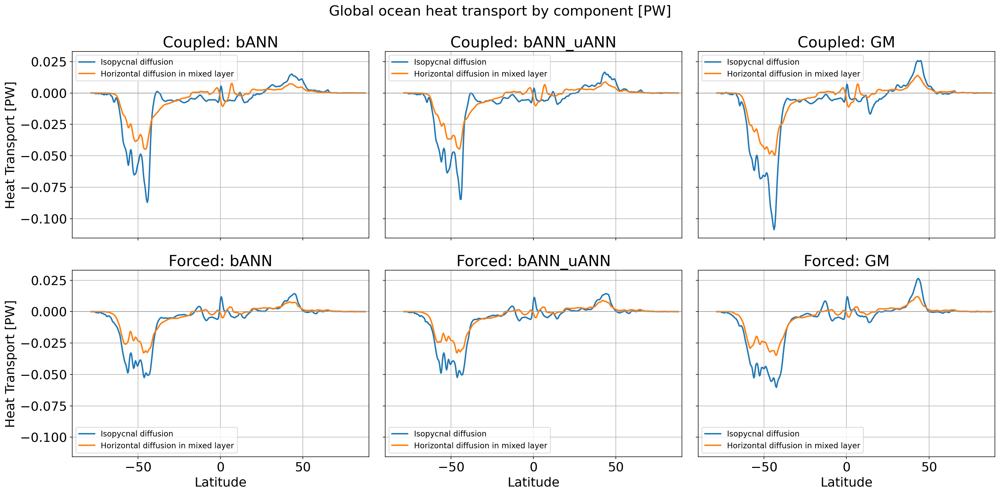

In [22]:
# Global (all-basin) valid latitudes; reuse global_mask from section 3
global_valid = global_mask.sum('xh').values > 0

fig, axes = plt.subplots(2, 3, figsize=(20, 10), dpi=150, sharex=True, sharey=True)
for row, (regime, names) in enumerate([('Coupled', coupled_names),
                                       ('Forced', forced_names)]):
    for col, name in enumerate(names):
        ax = axes[row, col]
        plot_ht_components(ax, name, global_mask, global_valid,
                           min_lat=-90, xlim=(-90, 90))
        ax.set_title(f'{regime}: {LABELS[name]}')
        if col:
            ax.set_ylabel('')
        if row == 0:
            ax.set_xlabel('')
fig.suptitle('Global ocean heat transport by component [PW]', fontsize=20)
plt.tight_layout()
plt.show()

# 6. AMOC and ACC time series

- **AMOC**: Atlantic overturning at 26$\degree$N (`amoc_26` from the `MOC` diagnostic), a natural annual time series.
- **ACC**: Antarctic Circumpolar Current strength proxied by the Drake Passage volume transport (from the section-transport diagnostic), coarsened from monthly to annual.

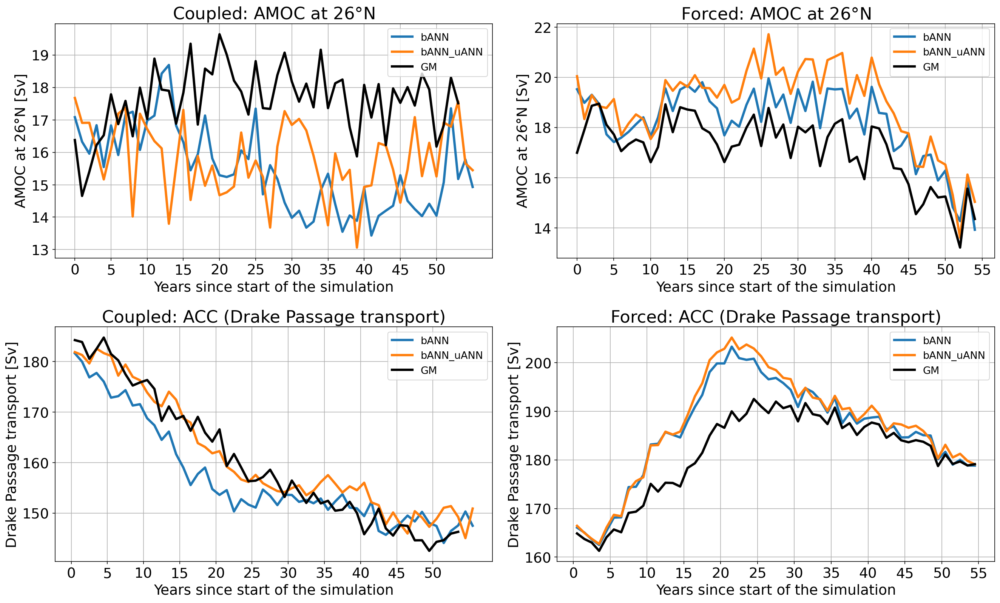

In [45]:
import xarray as xr


def _set_year_ticks(ax, times):
    """Label the time axis as years since the start of the simulation (5-year ticks)."""
    y0 = times[0].year
    years = list(range(y0, times[-1].year + 2, 5))
    ax.set_xticks([cftime.DatetimeNoLeap(y, 1, 1) for y in years])
    ax.set_xticklabels([y - y0 for y in years])
    ax.set_xlabel('Years since start of the simulation')


def plot_amoc(ax, names, title):
    """AMOC at 26N [Sv] annual time series."""
    for name in names:
        ts = exps[name].moc()['amoc_26']
        is_ctrl = name.endswith('CTRL')
        ts.plot(ax=ax, label=LABELS[name], lw=3, color='k' if is_ctrl else None)
    _set_year_ticks(ax, ts.time.values)
    ax.set_title(title)
    ax.set_ylabel('AMOC at 26$\\degree$N [Sv]')
    ax.grid(True)
    ax.legend(loc='best', fontsize=13)


def plot_acc(ax, names, title):
    """Drake Passage volume transport [Sv], monthly coarsened to annual."""
    for name in names:
        ts = (exps[name].section_transports()['transport']
              .sel(sections='h.Drake_Passage').coarsen(time=12).mean())
        is_ctrl = name.endswith('CTRL')
        ts.plot(ax=ax, label=LABELS[name], lw=3, color='k' if is_ctrl else None)
    _set_year_ticks(ax, ts.time.values)
    ax.set_title(title)
    ax.set_ylabel('Drake Passage transport [Sv]')
    ax.grid(True)
    ax.legend(loc='best', fontsize=13)


fig, axes = plt.subplots(2, 2, figsize=(18, 11), dpi=150)
plot_amoc(axes[0, 0], coupled_names, 'Coupled: AMOC at 26$\\degree$N')
plot_amoc(axes[0, 1], forced_names, 'Forced: AMOC at 26$\\degree$N')
plot_acc(axes[1, 0], coupled_names, 'Coupled: ACC (Drake Passage transport)')
plot_acc(axes[1, 1], forced_names, 'Forced: ACC (Drake Passage transport)')
plt.tight_layout()
plt.show()

# 7. Overturning streamfunctions: global MOC and AMOC

Time-mean meridional overturning streamfunctions, read from each experiment's
`*_MOC.nc` (depth / **z** coordinates) and `*_MOC_sigma2.nc` (**rho2 /
$\sigma_2$** coordinates) files. For each field we show a 2$\times$3 grid:
coupled experiments on the top row, forced on the bottom row.

- **Global MOC** (`moc`): includes the wind-driven cells, AABW and the deep
  overturning; the $\sigma_2$ view emphasises the dense-water (AABW/NADW) limbs.
- **AMOC** (`amoc`): the Atlantic-basin overturning (NADW cell / RAPID at
  26$\degree$N).

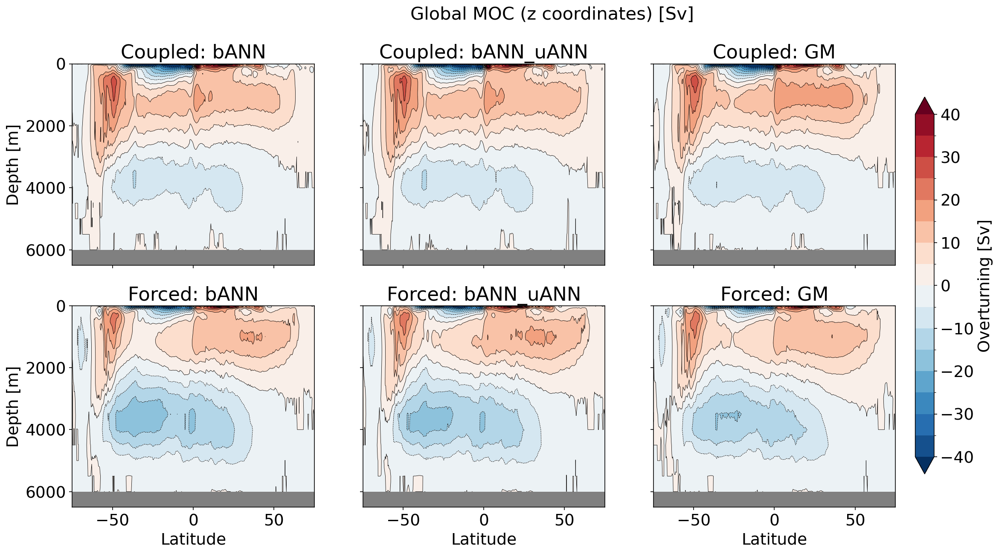

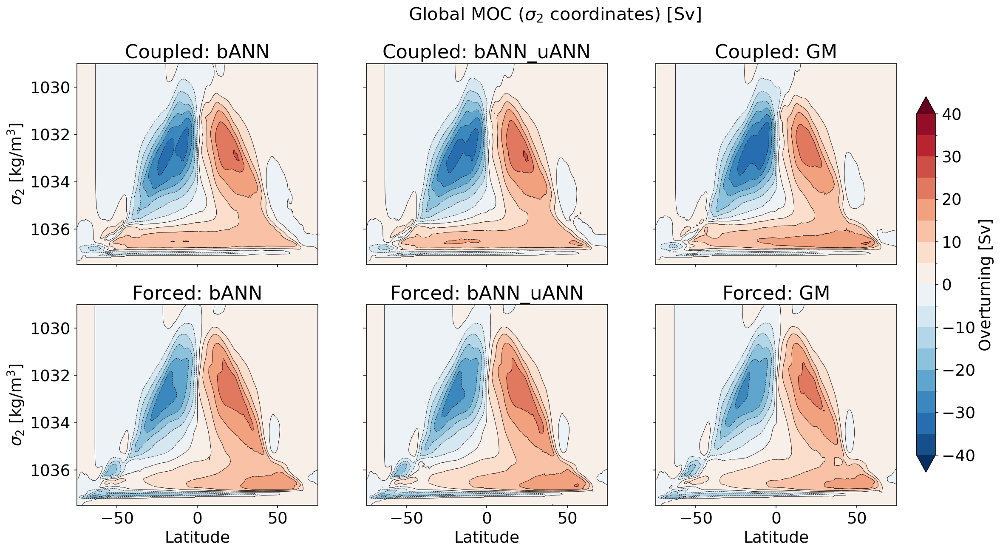

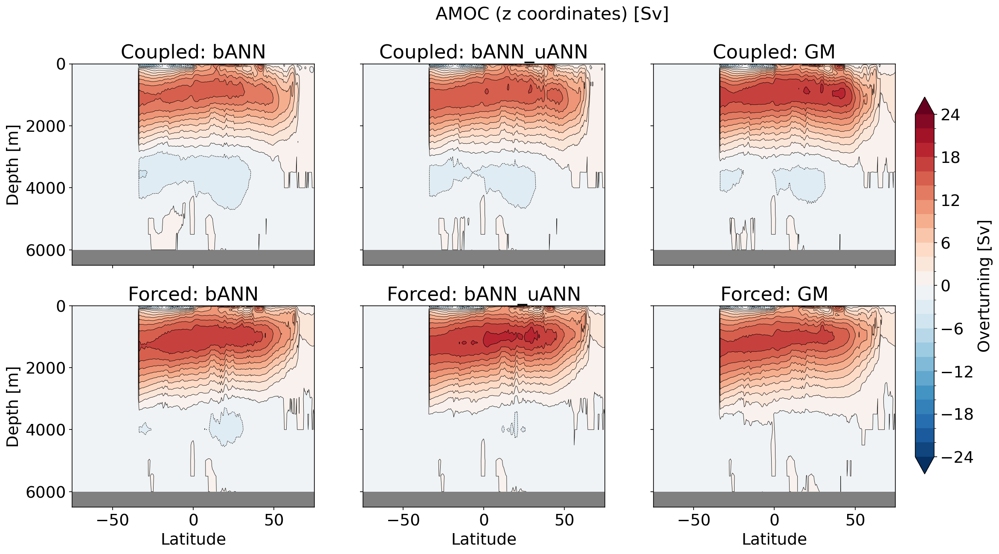

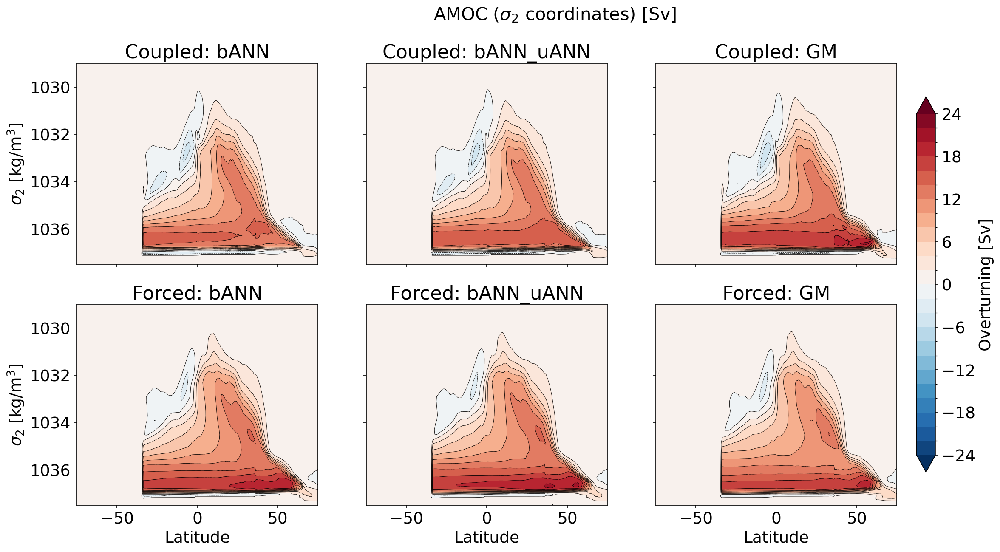

In [24]:
# Contour levels (Sv): global overturning is stronger than the Atlantic cell.
GLOBAL_LEVELS = np.arange(-40, 41, 5)
ATL_LEVELS = np.arange(-24, 25, 2)

Z_YLIM = (6500, 0)          # depth [m], inverted (surface at top)
RHO2_YLIM = (1037.5, 1029)  # sigma2 [kg/m^3], densest water at the bottom


def _plot_moc_panel(ax, field, ycoord, levels, ylim):
    """Draw one filled+line overturning streamfunction panel."""
    cf = field.plot.contourf(ax=ax, x='yq', y=ycoord, levels=levels,
                             cmap='RdBu_r', extend='both', add_colorbar=False)
    field.plot.contour(ax=ax, x='yq', y=ycoord, levels=levels,
                       colors='k', linewidths=0.4, add_labels=False)
    ax.set_facecolor('gray')  # land / no-data masked cells
    ax.set_xlim(-75, 75)
    ax.set_ylim(ylim)
    ax.set_title('')
    return cf


def plot_moc_grid(reader, var, ycoord, ylabel, levels, ylim, suptitle):
    """2x3 grid of overturning panels (coupled top row, forced bottom row)."""
    fig, axes = plt.subplots(2, 3, figsize=(20, 9), dpi=150,
                             sharex=True, sharey=True)
    cf = None
    for row, (regime, names) in enumerate([('Coupled', coupled_names),
                                           ('Forced', forced_names)]):
        for col, name in enumerate(names):
            ax = axes[row, col]
            field = reader(exps[name])[var]
            cf = _plot_moc_panel(ax, field, ycoord, levels, ylim)
            ax.set_title(f'{regime}: {LABELS[name]}')
            ax.set_xlabel('Latitude' if row == 1 else '')
            ax.set_ylabel(ylabel if col == 0 else '')
    fig.colorbar(cf, ax=axes, label='Overturning [Sv]', extend='both',
                 shrink=0.85, pad=0.02)
    fig.suptitle(suptitle, fontsize=20)
    plt.show()


# Global MOC
plot_moc_grid(lambda e: e.moc(), 'moc', 'zl', 'Depth [m]',
              GLOBAL_LEVELS, Z_YLIM, 'Global MOC (z coordinates) [Sv]')
plot_moc_grid(lambda e: e.moc_sigma2(), 'moc', 'rho2_l', r'$\sigma_2$ [kg/m$^3$]',
              GLOBAL_LEVELS, RHO2_YLIM, r'Global MOC ($\sigma_2$ coordinates) [Sv]')

# AMOC (Atlantic basin)
plot_moc_grid(lambda e: e.moc(), 'amoc', 'zl', 'Depth [m]',
              ATL_LEVELS, Z_YLIM, 'AMOC (z coordinates) [Sv]')
plot_moc_grid(lambda e: e.moc_sigma2(), 'amoc', 'rho2_l', r'$\sigma_2$ [kg/m$^3$]',
              ATL_LEVELS, RHO2_YLIM, r'AMOC ($\sigma_2$ coordinates) [Sv]')

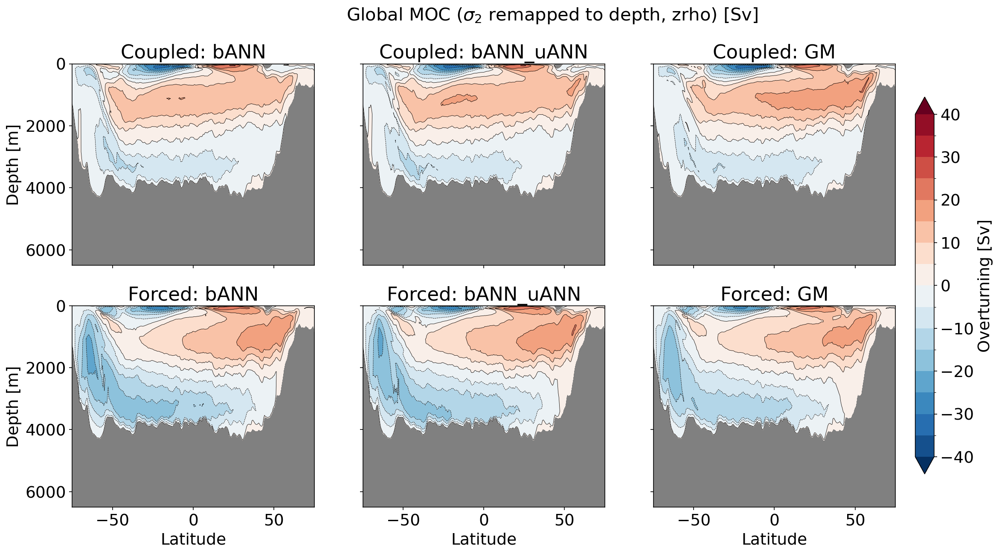

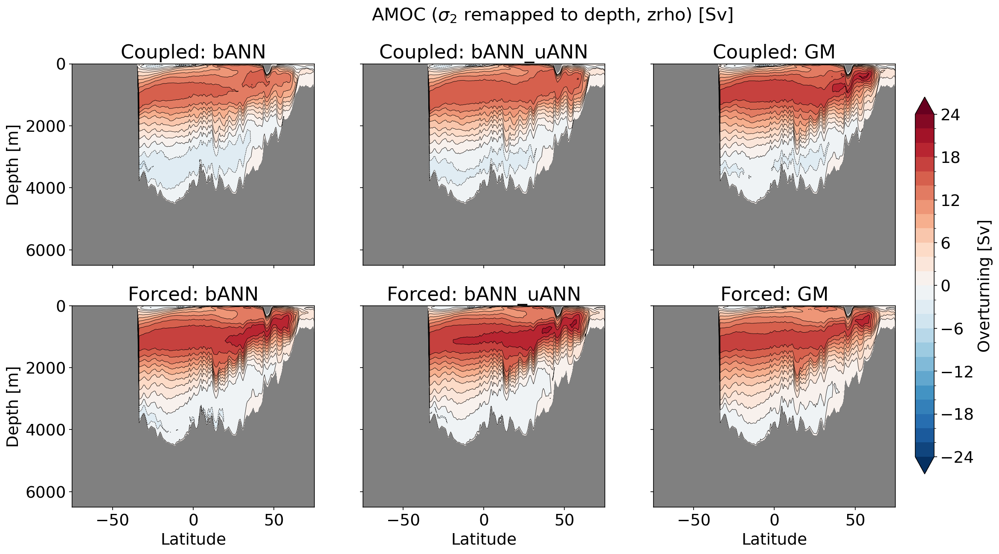

In [25]:
# --- Same sigma2 overturning, but remapped to DEPTH (zrho) coordinates ---
# moc_sigma2() also stores the zonal-mean depth of each sigma2 layer
# (moc_depth / amoc_depth, dims (rho2_l, yq)). Plotting the density-space
# streamfunction against that 2D depth coordinate shows the isopycnal
# (residual) overturning in depth space: the cells are still those computed in
# sigma2 coordinates, but each density surface sits at its true mean depth.

# Global MOC in zrho (sigma2 remapped to depth)
plot_moc_grid(lambda e: e.moc_sigma2(), 'moc', 'moc_depth', 'Depth [m]',
              GLOBAL_LEVELS, Z_YLIM, r'Global MOC ($\sigma_2$ remapped to depth, zrho) [Sv]')

# AMOC in zrho (sigma2 remapped to depth)
plot_moc_grid(lambda e: e.moc_sigma2(), 'amoc', 'amoc_depth', 'Depth [m]',
              ATL_LEVELS, Z_YLIM, r'AMOC ($\sigma_2$ remapped to depth, zrho) [Sv]')


# 8. Southern Ocean overturning by component

The global MOC in `*_MOC.nc` is a **residual-mean** streamfunction that already
combines three contributions. `mom6-tools/moc.py` also stores the parameterized
eddy pieces separately, so the Eulerian-mean part can be recovered by
subtraction:

| Component | Field | Transport source (MOM6) |
|---|---|---|
| **Eulerian mean** | `moc − moc_GM − moc_FFH` | resolved transport `vmo` minus the two eddy bolus terms |
| **GM (mesoscale)** | `moc_GM` | `vhGM` — Gent–McWilliams thickness-diffusion bolus |
| **Mixed-layer eddies** | `moc_FFH` | `vhml` — mixed-layer restratification (Fox-Kemper/FFH submesoscale) |

Below, each contribution is shown as a latitude–depth streamfunction zoomed on
the Southern Ocean (80–30$\degree$S), with coupled experiments on the top row and
forced on the bottom row. Positive/negative contours show clockwise/anticlockwise
cells; note the GM and MLE cells are weaker than the Eulerian (Deacon) cell and
use their own contour scale.

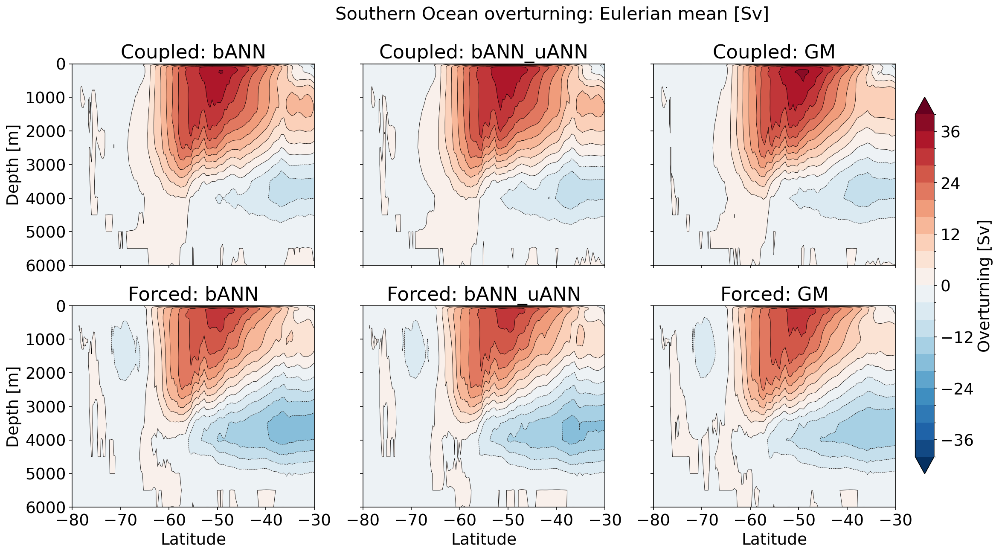

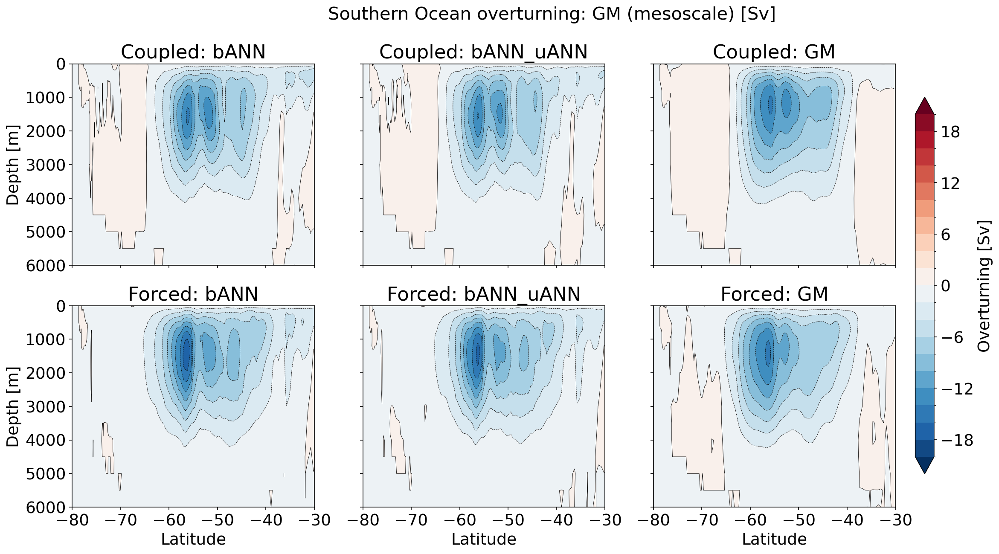

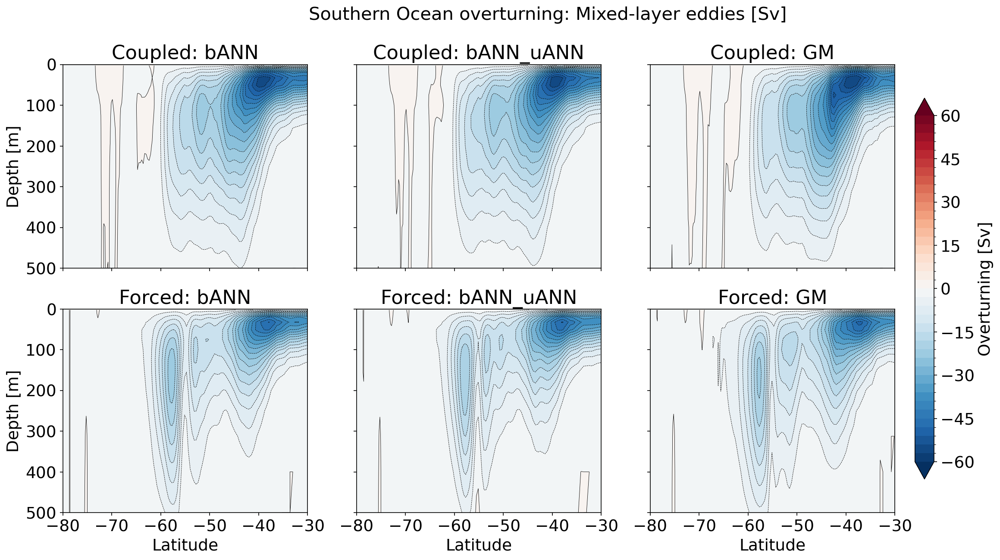

In [12]:
# Southern Ocean overturning components from *_MOC.nc (z coordinates)
SO_XLIM = (-80, -30)   # Southern Ocean latitude window
Z_YLIM = (6000, 0)

# component -> (field builder, contour levels)
MOC_COMPONENTS = {
    'Eulerian mean':      (lambda ds: ds['moc'] - ds['moc_GM'] - ds['moc_FFH'],
                           np.arange(-40, 41, 4)),
    'GM (mesoscale)':     (lambda ds: ds['moc_GM'],  np.arange(-20, 21, 2)),
    'Mixed-layer eddies': (lambda ds: ds['moc_FFH'], np.arange(-60, 63, 3)),
}


def plot_so_moc_component(component):
    """2x3 grid (coupled top / forced bottom) of one SO overturning component."""
    builder, levels = MOC_COMPONENTS[component]
    ylim = (500, 0) if component == 'Mixed-layer eddies' else Z_YLIM
    fig, axes = plt.subplots(2, 3, figsize=(20, 9), dpi=150,
                             sharex=True, sharey=True)
    cf = None
    for row, (regime, names) in enumerate([('Coupled', coupled_names),
                                           ('Forced', forced_names)]):
        for col, name in enumerate(names):
            ax = axes[row, col]
            field = builder(exps[name].moc())
            cf = field.plot.contourf(ax=ax, x='yq', y='zl', levels=levels,
                                     cmap='RdBu_r', extend='both',
                                     add_colorbar=False)
            field.plot.contour(ax=ax, x='yq', y='zl', levels=levels,
                               colors='k', linewidths=0.4, add_labels=False)
            ax.set_facecolor('gray')
            ax.set_xlim(SO_XLIM)
            ax.set_ylim(ylim)
            ax.set_title(f'{regime}: {LABELS[name]}')
            ax.set_xlabel('Latitude' if row == 1 else '')
            ax.set_ylabel('Depth [m]' if col == 0 else '')
    fig.colorbar(cf, ax=axes, label='Overturning [Sv]', extend='both',
                 shrink=0.85, pad=0.02)
    fig.suptitle(f'Southern Ocean overturning: {component} [Sv]', fontsize=20)
    plt.show()


for component in MOC_COMPONENTS:
    plot_so_moc_component(component)

# 9. Atlantic overturning by component

Same residual-mean decomposition as section 8, but for the **Atlantic basin**
(`amoc` and friends in `*_MOC.nc`). `mom6-tools/moc.py` now stores the Atlantic
Eulerian / GM / mixed-layer-eddy overturning streamfunctions separately:

| Component | Field | Transport source (MOM6) |
|---|---|---|
| **Eulerian mean** | `amoc_eulerian` = `amoc − amoc_GM − amoc_FFH` | resolved `vmo` minus the two eddy bolus terms, Atlantic mask |
| **GM (mesoscale)** | `amoc_GM` | `vhGM` — Gent–McWilliams thickness-diffusion bolus |
| **Mixed-layer eddies** | `amoc_FFH` | `vhml` — mixed-layer restratification (Fox-Kemper/FFH submesoscale) |

The Atlantic mask is codes 2, 4, 6, 7, 8 (Atlantic + Arctic + Med + Baltic +
Hudson Bay), matching sections 3 and 6. Each contribution is shown as a
latitude–depth streamfunction (coupled top row, forced bottom row); the GM and
MLE cells are weaker than the Eulerian (NADW) cell and use their own contour
scale.

*Note:* `coupled_bANN_1.0_uANN_1.0` has no raw history available, so its
`*_MOC.nc` predates the per-basin decomposition and its panels are left blank.


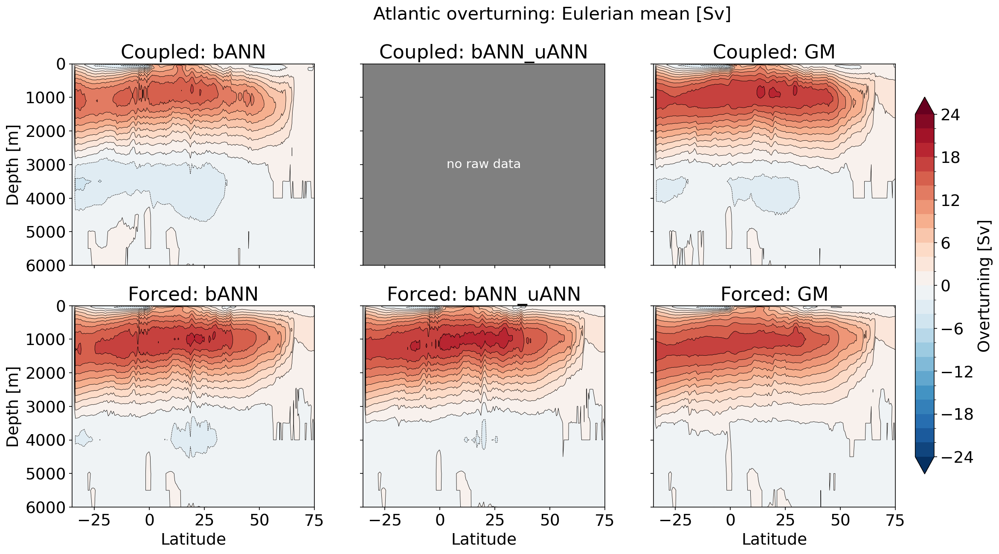

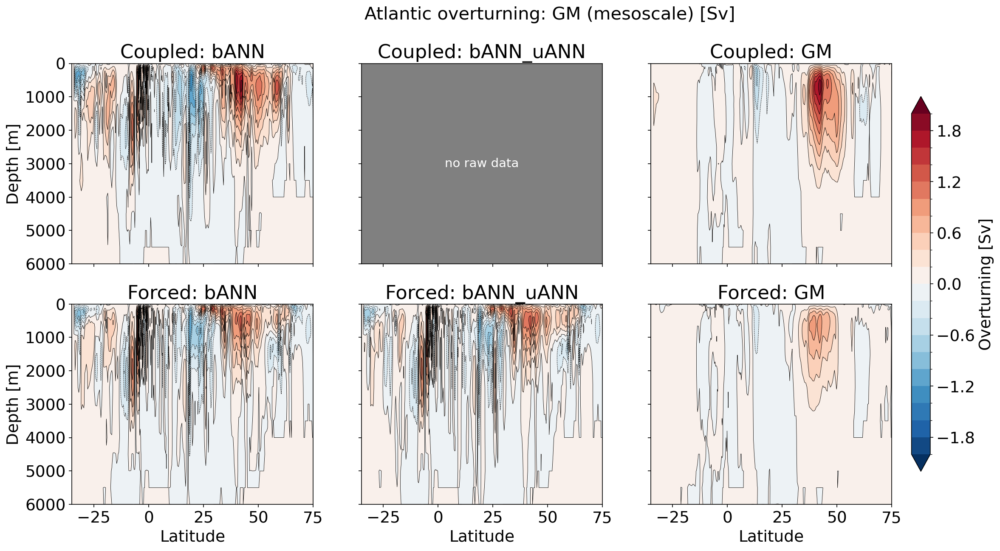

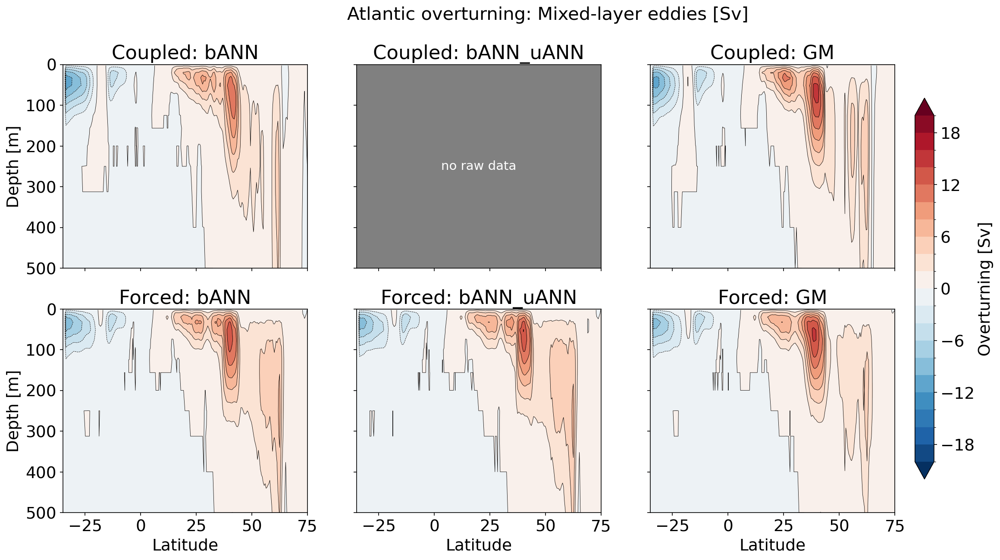

In [15]:
# Atlantic overturning components from *_MOC.nc (z coordinates)
ATL_XLIM = (-35, 75)   # Atlantic latitude window

# component -> (field name, contour levels). Uses the per-basin fields added to
# moc.py: amoc_eulerian, amoc_GM, amoc_FFH.
AMOC_COMPONENTS = {
    'Eulerian mean':      ('amoc_eulerian', np.arange(-24, 25, 2)),
    'GM (mesoscale)':     ('amoc_GM',       np.arange(-2, 2.2, 0.2)),
    'Mixed-layer eddies': ('amoc_FFH',      np.arange(-20, 22, 2)),
}


def plot_amoc_component(component):
    """2x3 grid (coupled top / forced bottom) of one Atlantic overturning component."""
    var, levels = AMOC_COMPONENTS[component]
    ylim = (500, 0) if component == 'Mixed-layer eddies' else Z_YLIM
    fig, axes = plt.subplots(2, 3, figsize=(20, 9), dpi=150,
                             sharex=True, sharey=True)
    cf = None
    for row, (regime, names) in enumerate([('Coupled', coupled_names),
                                           ('Forced', forced_names)]):
        for col, name in enumerate(names):
            ax = axes[row, col]
            ds = exps[name].moc()
            if var in ds:
                field = ds[var]
                cf = field.plot.contourf(ax=ax, x='yq', y='zl', levels=levels,
                                         cmap='RdBu_r', extend='both',
                                         add_colorbar=False)
                field.plot.contour(ax=ax, x='yq', y='zl', levels=levels,
                                   colors='k', linewidths=0.4, add_labels=False)
            else:  # experiment without the updated per-basin fields
                ax.text(0.5, 0.5, 'no raw data', ha='center', va='center',
                        transform=ax.transAxes, color='white', fontsize=14)
            ax.set_facecolor('gray')
            ax.set_xlim(ATL_XLIM)
            ax.set_ylim(ylim)
            ax.set_title(f'{regime}: {LABELS[name]}')
            ax.set_xlabel('Latitude' if row == 1 else '')
            ax.set_ylabel('Depth [m]' if col == 0 else '')
    if cf is not None:
        fig.colorbar(cf, ax=axes, label='Overturning [Sv]', extend='both',
                     shrink=0.85, pad=0.02)
    fig.suptitle(f'Atlantic overturning: {component} [Sv]', fontsize=20)
    plt.show()


for component in AMOC_COMPONENTS:
    plot_amoc_component(component)


# 10. Indo-Pacific overturning by component

Same residual-mean decomposition as section 9, but for the **Indo-Pacific basin**
(`ipmoc` and friends in `*_MOC.nc`), following the per-basin fields stored by
`mom6-tools/moc.py`:

| Component | Field | Transport source (MOM6) |
|---|---|---|
| **Eulerian mean** | `ipmoc_eulerian` = `ipmoc - ipmoc_GM - ipmoc_FFH` | resolved `vmo` minus the two eddy bolus terms, Indo-Pacific mask |
| **GM (mesoscale)** | `ipmoc_GM` | `vhGM` - Gent-McWilliams thickness-diffusion bolus |
| **Mixed-layer eddies** | `ipmoc_FFH` | `vhml` - mixed-layer restratification (Fox-Kemper/FFH submesoscale) |

The Indo-Pacific mask is codes 3, 5 (Pacific + Indian), matching sections 3 and 7.
Each contribution is shown as a latitude-depth streamfunction (coupled top row,
forced bottom row). The overturning is dominated by the wind-driven subtropical
cells and the strong equatorial cells (note the wider contour scales here than in
the Atlantic).

*Note:* `coupled_bANN_1.0_uANN_1.0` has no raw history available, so its
`*_MOC.nc` predates the per-basin decomposition and its panels are left blank.


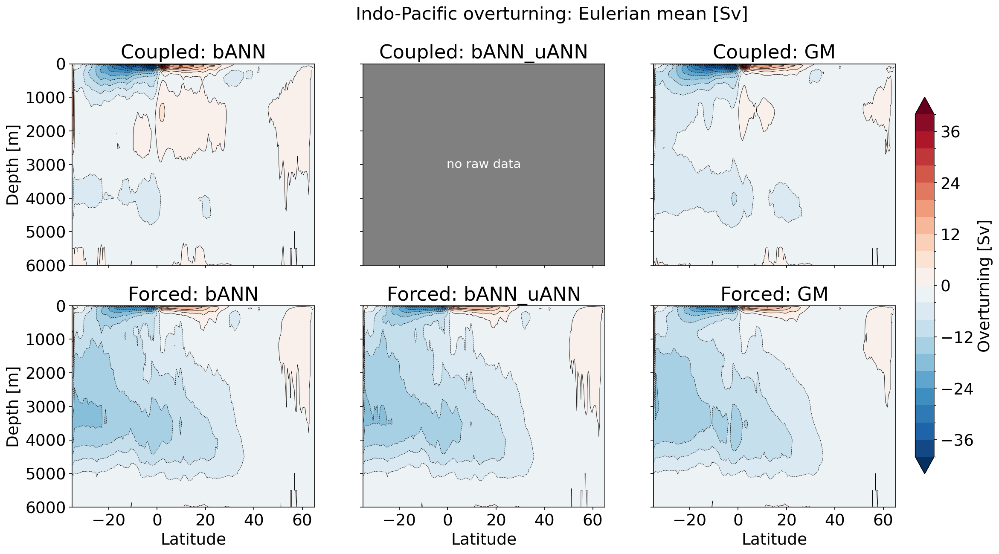

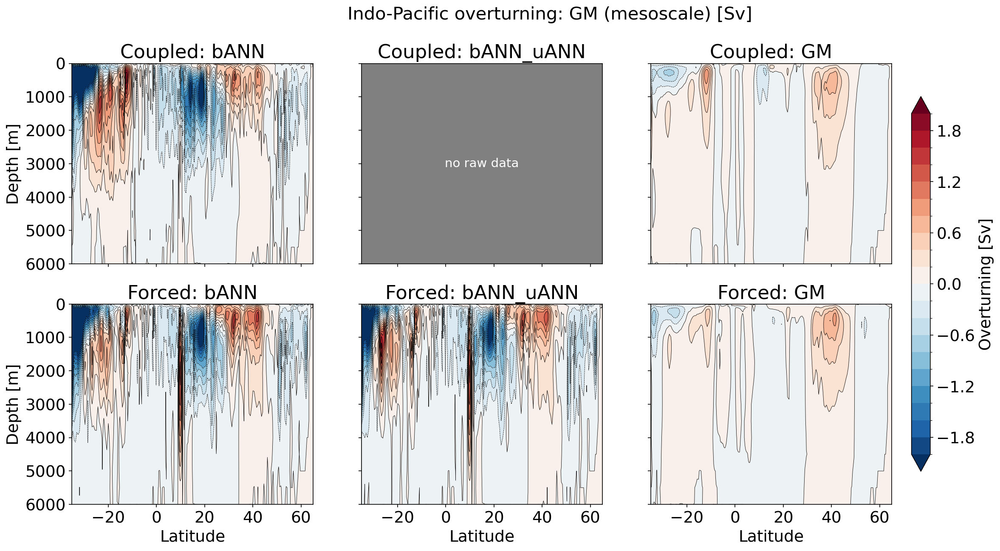

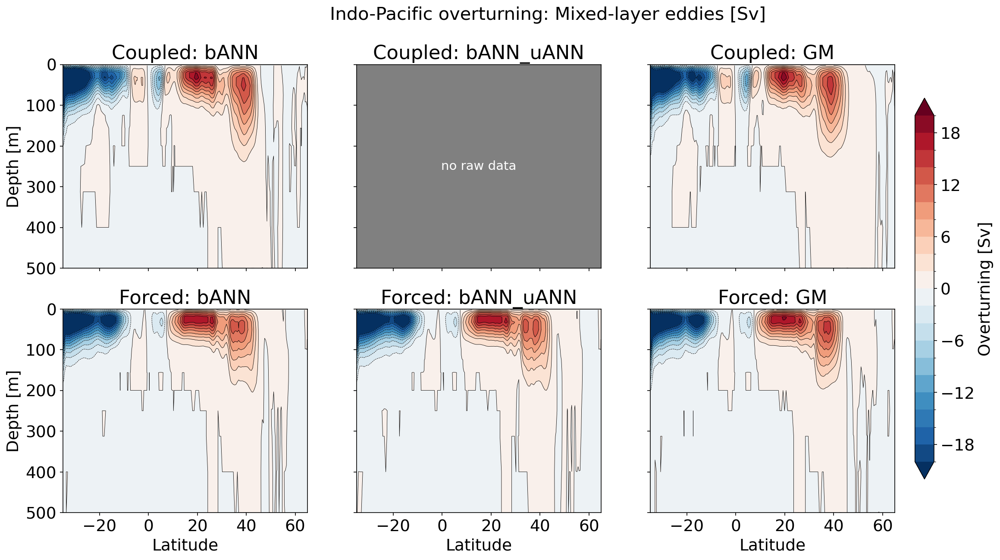

In [16]:
# Indo-Pacific overturning components from *_MOC.nc (z coordinates)
IP_XLIM = (-35, 65)   # Indo-Pacific latitude window

# component -> (field name, contour levels). Uses the per-basin fields added to
# moc.py: ipmoc_eulerian, ipmoc_GM, ipmoc_FFH.
IPMOC_COMPONENTS = {
    'Eulerian mean':      ('ipmoc_eulerian', np.arange(-40, 41, 4)),
    'GM (mesoscale)':     ('ipmoc_GM',       np.arange(-2, 2.2, 0.2)),
    'Mixed-layer eddies': ('ipmoc_FFH',      np.arange(-20, 21, 2)),
}


def plot_ipmoc_component(component):
    """2x3 grid (coupled top / forced bottom) of one Indo-Pacific overturning component."""
    var, levels = IPMOC_COMPONENTS[component]
    ylim = (500, 0) if component == 'Mixed-layer eddies' else Z_YLIM
    fig, axes = plt.subplots(2, 3, figsize=(20, 9), dpi=150,
                             sharex=True, sharey=True)
    cf = None
    for row, (regime, names) in enumerate([('Coupled', coupled_names),
                                           ('Forced', forced_names)]):
        for col, name in enumerate(names):
            ax = axes[row, col]
            ds = exps[name].moc()
            if var in ds:
                field = ds[var]
                cf = field.plot.contourf(ax=ax, x='yq', y='zl', levels=levels,
                                         cmap='RdBu_r', extend='both',
                                         add_colorbar=False)
                field.plot.contour(ax=ax, x='yq', y='zl', levels=levels,
                                   colors='k', linewidths=0.4, add_labels=False)
            else:  # experiment without the updated per-basin fields
                ax.text(0.5, 0.5, 'no raw data', ha='center', va='center',
                        transform=ax.transAxes, color='white', fontsize=14)
            ax.set_facecolor('gray')
            ax.set_xlim(IP_XLIM)
            ax.set_ylim(ylim)
            ax.set_title(f'{regime}: {LABELS[name]}')
            ax.set_xlabel('Latitude' if row == 1 else '')
            ax.set_ylabel('Depth [m]' if col == 0 else '')
    if cf is not None:
        fig.colorbar(cf, ax=axes, label='Overturning [Sv]', extend='both',
                     shrink=0.85, pad=0.02)
    fig.suptitle(f'Indo-Pacific overturning: {component} [Sv]', fontsize=20)
    plt.show()


for component in IPMOC_COMPONENTS:
    plot_ipmoc_component(component)


# 11. Surface isopycnal (Redi) diffusivity

Horizontal maps of the surface epineutral tracer diffusivity `diftrelo`
(Ocean Tracer Epineutral Laplacian Diffusivity, m^2 s^-1), time-averaged over
model years 50-54 (surface interface, zi = 0 m). This is the isopycnal (Redi)
diffusivity applied by the tracer-mixing scheme, useful for contrasting the GM
control against the (b)ANN parameterizations.

The first cell computes and caches the surface field to
`<folder>/<name>_diftrelo_surface.nc` (heavy: reads the raw native history for
each experiment; experiments already cached, or without native output, are
skipped). The second cell plots them.

In [12]:
# Compute (and cache) the time-mean surface epineutral diffusivity for every
# experiment. Reads raw native history over years 50-54 -> heavy step, so it
# skips any experiment already cached (or without native output on disk).
for name in exp_names:
    exp = exps[name]
    try:
        exp.compute_diftrelo_surface()
    except:
        print(f'{name} skipped')
        

Files to be read: ['/glade/derecho/scratch/jiarongw/archive/CTRL/ocn/hist/CTRL.mom6.h.native.0053-06.nc', '/glade/derecho/scratch/jiarongw/archive/CTRL/ocn/hist/CTRL.mom6.h.native.0051-06.nc', '/glade/derecho/scratch/jiarongw/archive/CTRL/ocn/hist/CTRL.mom6.h.native.0052-02.nc', '/glade/derecho/scratch/jiarongw/archive/CTRL/ocn/hist/CTRL.mom6.h.native.0051-04.nc', '/glade/derecho/scratch/jiarongw/archive/CTRL/ocn/hist/CTRL.mom6.h.native.0052-06.nc', '/glade/derecho/scratch/jiarongw/archive/CTRL/ocn/hist/CTRL.mom6.h.native.0051-01.nc', '/glade/derecho/scratch/jiarongw/archive/CTRL/ocn/hist/CTRL.mom6.h.native.0050-10.nc', '/glade/derecho/scratch/jiarongw/archive/CTRL/ocn/hist/CTRL.mom6.h.native.0050-08.nc', '/glade/derecho/scratch/jiarongw/archive/CTRL/ocn/hist/CTRL.mom6.h.native.0052-11.nc', '/glade/derecho/scratch/jiarongw/archive/CTRL/ocn/hist/CTRL.mom6.h.native.0052-10.nc', '/glade/derecho/scratch/jiarongw/archive/CTRL/ocn/hist/CTRL.mom6.h.native.0051-03.nc', '/glade/derecho/scratch/

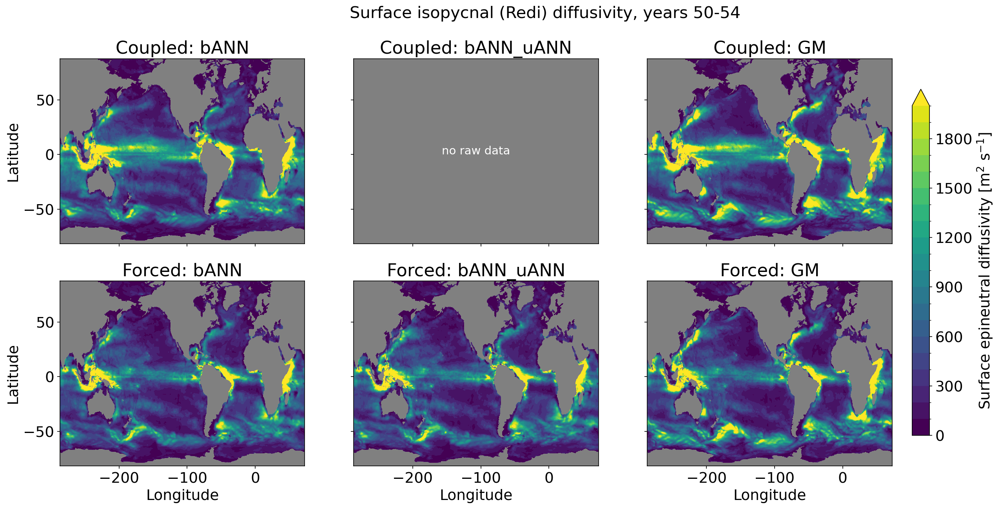

In [13]:
# Surface epineutral (Redi) diffusivity maps: 2x3 grid
# (coupled top / forced bottom).
DIFF_LEVELS = np.arange(0, 2001, 100)   # m^2 s^-1

fig, axes = plt.subplots(2, 3, figsize=(22, 9), dpi=150,
                         sharex=True, sharey=True)
cf = None
for row, (regime, names) in enumerate([('Coupled', coupled_names),
                                       ('Forced', forced_names)]):
    for col, name in enumerate(names):
        ax = axes[row, col]
        try:
            field = exps[name].diftrelo_surface()
            cf = field.plot.contourf(ax=ax, x='xh', y='yh', levels=DIFF_LEVELS,
                                     cmap='viridis', extend='max',
                                     add_colorbar=False)
        except (FileNotFoundError, KeyError):  # experiment without native data
            ax.text(0.5, 0.5, 'no raw data', ha='center', va='center',
                    transform=ax.transAxes, color='white', fontsize=14)
        ax.set_facecolor('gray')
        ax.set_title(f'{regime}: {LABELS[name]}')
        ax.set_xlabel('Longitude' if row == 1 else '')
        ax.set_ylabel('Latitude' if col == 0 else '')
if cf is not None:
    fig.colorbar(cf, ax=axes, label=r'Surface epineutral diffusivity [m$^2$ s$^{-1}$]',
                 extend='max', shrink=0.85, pad=0.02)
fig.suptitle(r'Surface isopycnal (Redi) diffusivity, years 50-54',
             fontsize=20)
plt.show()